I. KITTI Dataset

1.1 Data Loading

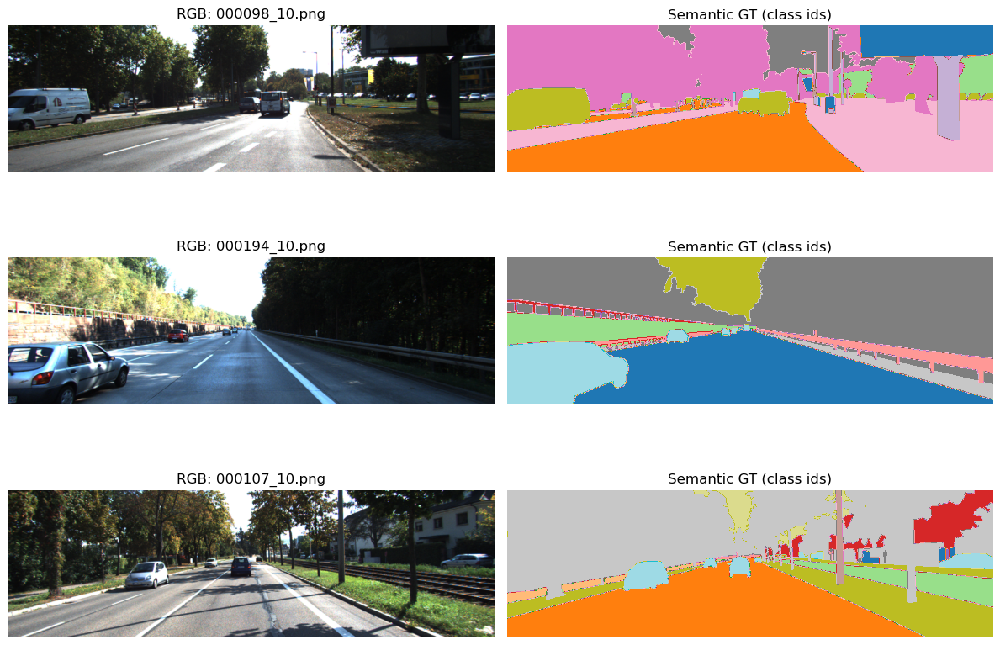

In [58]:
from pathlib import Path
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

ROOT = Path(r"D:\Semantic Visual Odometry and 3D Scene Reconstruction\KITTI")
TRAIN = ROOT / "semantics" / "training"

IMG_DIR = TRAIN / "image_2"
GT_DIR  = TRAIN / "semantic"

assert IMG_DIR.exists(), f"Нет image_2: {IMG_DIR}"
assert GT_DIR.exists(),  f"Нет semantic GT: {GT_DIR}"

NUM_SAMPLES = 3
random.seed(0)

pairs = []
for img_path in IMG_DIR.glob("*.png"):
    gt_path = GT_DIR / img_path.name
    if gt_path.exists():
        pairs.append((img_path, gt_path))

samples = random.sample(pairs, min(NUM_SAMPLES, len(pairs)))

plt.figure(figsize=(12, 3 * len(samples)))

for i, (img_path, gt_path) in enumerate(samples):
    img = np.array(Image.open(img_path).convert("RGB"))
    gt  = np.array(Image.open(gt_path))

    plt.subplot(len(samples), 2, 2*i + 1)
    plt.imshow(img)
    plt.title(f"RGB: {img_path.name}")
    plt.axis("off")

    plt.subplot(len(samples), 2, 2*i + 2)
    plt.imshow(gt, cmap="tab20")
    plt.title("Semantic GT (class ids)")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd

assert IMG_DIR.exists(), f"Missing directory RGB: {IMG_DIR}"
assert GT_DIR.exists(),  f"Missing directory semantic GT: {GT_DIR}"

rows = []

for img_path in sorted(IMG_DIR.glob("*.png")):
    mask_path = GT_DIR / img_path.name
    if mask_path.exists():
        rows.append({
            "rgb_path": str(img_path),
            "mask_path": str(mask_path)
        })

In [60]:
kitti_df = pd.DataFrame(rows)
len(kitti_df)

200

In [ ]:
NUM_SAMPLES = 20  
IGNORE = 255
all_classes = set()

for i, row in kitti_df.sample(n=NUM_SAMPLES, random_state=0).iterrows():
    mask = np.array(Image.open(row["mask_path"]))
    unique_vals = np.unique(mask)
    all_classes.update(unique_vals.tolist())

In [62]:
RAW_TO_TRAIN_10 = {
    7: 0,    # road
    8: 1,    # sidewalk
    11: 2,   # building
    21: 3,   # vegetation
    23: 4,   # sky
    26: 5,   # car
    27: 5,   # truck
    28: 5,   # bus
    24: 6,   # person
    17: 7,   # pole
    20: 8,   # traffic sign
    22: 9,   # terrain
}

ignore_index = 255
NUM_CLASSES = 10

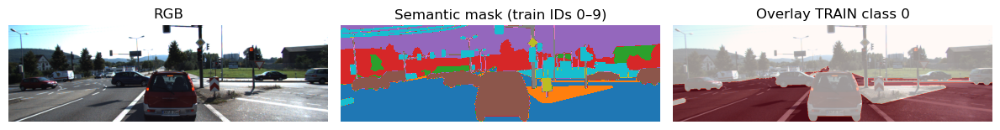

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

row = kitti_df.sample(1, random_state=50).iloc[0]
img = np.array(Image.open(row["rgb_path"]).convert("RGB"))
mask_raw = np.array(Image.open(row["mask_path"]))

mask_train = np.full_like(mask_raw, IGNORE)

for raw_id, train_id in RAW_TO_TRAIN_10.items():
    mask_train[mask_raw == raw_id] = train_id

TRAIN_CLASS_ID = 0  

binary = (mask_train == TRAIN_CLASS_ID)

plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(img)
plt.title("RGB")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(mask_train, cmap="tab10", vmin=0, vmax=9)
plt.title("Semantic mask (train IDs 0–9)")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(img)
plt.imshow(binary, alpha=0.6, cmap="Reds")
plt.title(f"Overlay TRAIN class {TRAIN_CLASS_ID}")
plt.axis("off")

plt.tight_layout()
plt.show()

In [64]:
from sklearn.model_selection import train_test_split

kitti_train_df, kitti_val_df = train_test_split(kitti_df, test_size=0.2, random_state=42, shuffle=True)

kitti_train_df = kitti_train_df.reset_index(drop=True)
kitti_val_df = kitti_val_df.reset_index(drop=True)

print(len(kitti_train_df), len(kitti_val_df))

160 40


1.2 Custom Dataset Creation

In [65]:
import numpy as np
import torch
from torch.utils.data import Dataset
from torch.utils.data import Dataset, DataLoader
from PIL import Image

class SegDataset(Dataset):
    def __init__(self, df, train=True, image_size=(256, 832),
                 id_map=None, ignore_index=255):
        self.df = df.reset_index(drop=True)
        self.train = train
        self.image_size = image_size
        self.id_map = id_map or {}
        self.ignore_index = ignore_index

    def __len__(self):
        return len(self.df)

    def _augment(self, img, mask):
        if random.random() < 0.5:
            img = TF.hflip(img)
            mask = TF.hflip(mask)
        if random.random() < 0.3:
            img = TF.adjust_brightness(img, 0.9 + 0.2 * random.random())
        if random.random() < 0.3:
            img = TF.adjust_contrast(img, 0.9 + 0.2 * random.random())
        return img, mask

    def _remap(self, mask_raw_np):
        out = np.full(mask_raw_np.shape, self.ignore_index, dtype=np.uint8)
        for src_id, train_id in self.id_map.items():
            out[mask_raw_np == src_id] = train_id
        return out

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row["rgb_path"]).convert("RGB")
        mask_raw = Image.open(row["mask_path"]).convert("L")

        H, W = self.image_size
        img = TF.resize(img, (H, W), interpolation=InterpolationMode.BILINEAR)
        mask_raw = TF.resize(mask_raw, (H, W), interpolation=InterpolationMode.NEAREST)

        if self.train:
            img, mask_raw = self._augment(img, mask_raw)

        img = TF.to_tensor(img)
        img = TF.normalize(img, mean=[0.485, 0.456, 0.406],
                                std=[0.229, 0.224, 0.225])

        mask_np = np.array(mask_raw, dtype=np.uint8)
        mask_np = self._remap(mask_np)
        mask = torch.from_numpy(mask_np.astype(np.int64))
        return img, mask

1.3 DataLoader Creation

In [ ]:
kitti_train_ds = SegDataset(kitti_train_df, train=True, id_map=RAW_TO_TRAIN_10, ignore_index=255)
kitti_val_ds   = SegDataset(kitti_val_df, train=False, id_map=RAW_TO_TRAIN_10, ignore_index=255)

kitti_train_loader = DataLoader(kitti_train_ds, batch_size=4, shuffle=True, num_workers=2, pin_memory=True, drop_last=True)
kitti_val_loader   = DataLoader(kitti_val_ds,   batch_size=4, shuffle=False, num_workers=2, pin_memory=True)

unique(train ids): [0, 1, 2, 3, 4, 5, 6, 7, 9]


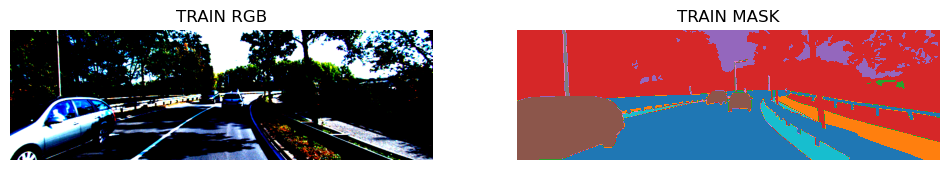

unique(train ids): [0, 1, 2, 3, 4, 5, 7, 8, 9]


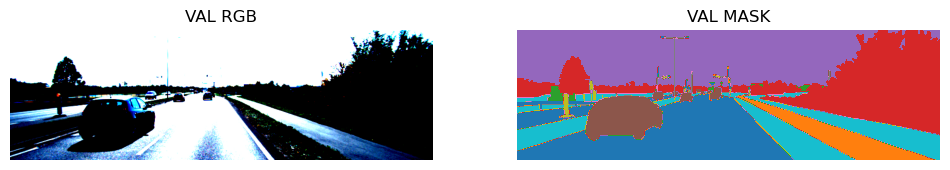

In [ ]:
import torchvision.transforms.functional as TF
from torchvision.transforms import InterpolationMode

USE_IMAGENET_NORM = False

IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
IMAGENET_STD  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)

IGNORE = 255
NUM_CLASSES = 10

TRAIN_ID_TO_NAME = {
    0: "road",
    1: "sidewalk",
    2: "building",
    3: "vegetation",
    4: "sky",
    5: "vehicle",
    6: "person",
    7: "pole",
    8: "traffic_sign",
    9: "terrain",
}

def show_sample(dataset, title=""):
    idx = random.randint(0, len(dataset) - 1)
    img, mask = dataset[idx]  

    uniq = torch.unique(mask)
    uniq_valid = uniq[uniq != IGNORE].tolist()

    print("unique(train ids):", uniq_valid)

    img_np = img.detach().cpu().clone()
    if USE_IMAGENET_NORM:
        img_np = img_np * IMAGENET_STD + IMAGENET_MEAN
    img_np = img_np.permute(1,2,0).numpy()
    img_np = img_np.clip(0, 1)

    mask_vis = mask.detach().cpu().numpy().copy()
    mask_vis[mask_vis == IGNORE] = -1

    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plt.imshow(img_np)
    plt.title(f"{title} RGB")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(mask_vis, cmap="tab10", vmin=0, vmax=NUM_CLASSES-1)
    plt.title(f"{title} MASK")
    plt.axis("off")

    plt.show()

show_sample(kitti_train_ds, "TRAIN")
show_sample(kitti_val_ds,   "VAL")

1.4 Model Initialization

In [23]:
import torch
import torch.nn as nn
import torch.optim as optim

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("DEVICE:", DEVICE)

DEVICE: cuda


In [24]:
from torchvision.models.segmentation import deeplabv3_resnet50

kitti_model = deeplabv3_resnet50(weights="DEFAULT")

kitti_model.classifier[-1] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)

if kitti_model.aux_classifier is not None:
    kitti_model.aux_classifier[-1] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)

kitti_model = kitti_model.to(DEVICE)

In [25]:
criterion = nn.CrossEntropyLoss(ignore_index=255)
kitti_optimizer = optim.AdamW(kitti_model.parameters(), lr=1e-4, weight_decay=1e-4)

scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE == "cuda"))

C:\Users\egork\AppData\Local\Temp\ipykernel_11836\1950933078.py:4: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE == "cuda"))


1.5 Model Training Functions

In [26]:
from tqdm import tqdm

@torch.no_grad()
def update_confusion_matrix(cm: torch.Tensor, preds: torch.Tensor, targets: torch.Tensor, num_classes: int, ignore_index: int):

    mask = (targets != ignore_index) & (targets >= 0) & (targets < num_classes)
    t = targets[mask].view(-1)
    p = preds[mask].view(-1)

    k = num_classes * t + p
    bins = torch.bincount(k, minlength=num_classes**2)
    cm += bins.view(num_classes, num_classes)
    return cm

@torch.no_grad()
def compute_miou_from_cm(cm: torch.Tensor):
    diag = torch.diag(cm).float()
    denom = (cm.sum(1).float() + cm.sum(0).float() - diag).clamp(min=1.0)
    iou = diag / denom
    miou = iou.mean().item()
    return miou, iou.detach().cpu().numpy()

def train_one_epoch(model, loader, optimizer, scaler, criterion):
    model.train()
    running_loss = 0.0

    for imgs, masks in tqdm(loader, desc="Train", leave=False):
        imgs = imgs.to(DEVICE, non_blocking=True)
        masks = masks.to(DEVICE, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with torch.cuda.amp.autocast(enabled=(DEVICE == "cuda")):
            out = model(imgs)["out"]      # (B,C,H,W)
            loss = criterion(out, masks)  # masks: (B,H,W)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * imgs.size(0)

    return running_loss / len(loader.dataset)

@torch.no_grad()
def evaluate(model, loader, criterion, num_classes: int, ignore_index: int):
    model.eval()
    running_loss = 0.0
    cm = torch.zeros((num_classes, num_classes), dtype=torch.int64, device=DEVICE)

    for imgs, masks in tqdm(loader, desc="Val", leave=False):
        imgs = imgs.to(DEVICE, non_blocking=True)
        masks = masks.to(DEVICE, non_blocking=True)

        with torch.cuda.amp.autocast(enabled=(DEVICE == "cuda")):
            out = model(imgs)["out"]
            loss = criterion(out, masks)

        running_loss += loss.item() * imgs.size(0)
        preds = out.argmax(dim=1)  # (B,H,W)

        for b in range(preds.size(0)):
            cm = update_confusion_matrix(cm, preds[b], masks[b], num_classes, ignore_index)

    val_loss = running_loss / len(loader.dataset)
    miou, per_class_iou = compute_miou_from_cm(cm)
    return val_loss, miou, per_class_iou

1.6 Training Loop

In [ ]:
EPOCHS = 50
best_miou = -1.0
best_epoch = -1

kitti_history = {"epoch": [], "train_loss": [], "val_loss": [], "val_miou": []}

for epoch in range(1, EPOCHS + 1):
    kitti_train_loss = train_one_epoch(kitti_model, kitti_train_loader, kitti_optimizer, scaler, criterion)
    kitti_val_loss, kitti_miou, per_class_iou = evaluate(kitti_model, kitti_val_loader, criterion, num_classes=NUM_CLASSES, ignore_index=IGNORE)

    kitti_history["epoch"].append(epoch)
    kitti_history["train_loss"].append(kitti_train_loss)
    kitti_history["val_loss"].append(kitti_val_loss)
    kitti_history["val_miou"].append(kitti_miou)

    print(f"[Epoch {epoch:02d}] train_loss={kitti_train_loss:.4f} | val_loss={kitti_val_loss:.4f} | mIoU={kitti_miou:.4f}")

    if kitti_miou > best_miou:
        best_miou = kitti_miou
        best_epoch = epoch
        torch.save(kitti_model.state_dict(), "kitti_deeplabv3_best.pth")
        print(f"saved best checkpoint: mIoU={best_miou:.4f} (epoch {best_epoch})")

print("Best mIoU:", best_miou, "at epoch", best_epoch)

1.7 Training History Visualization

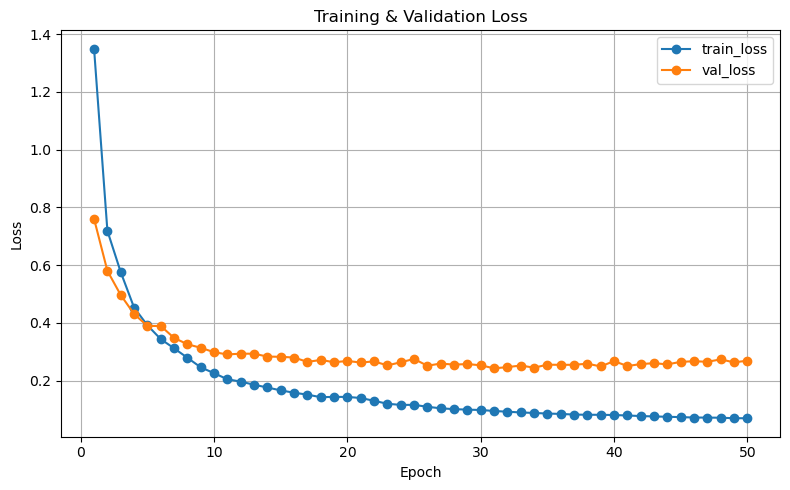

In [28]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.plot(kitti_history["epoch"], kitti_history["train_loss"], marker="o", label="train_loss")
plt.plot(kitti_history["epoch"], kitti_history["val_loss"], marker="o", label="val_loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

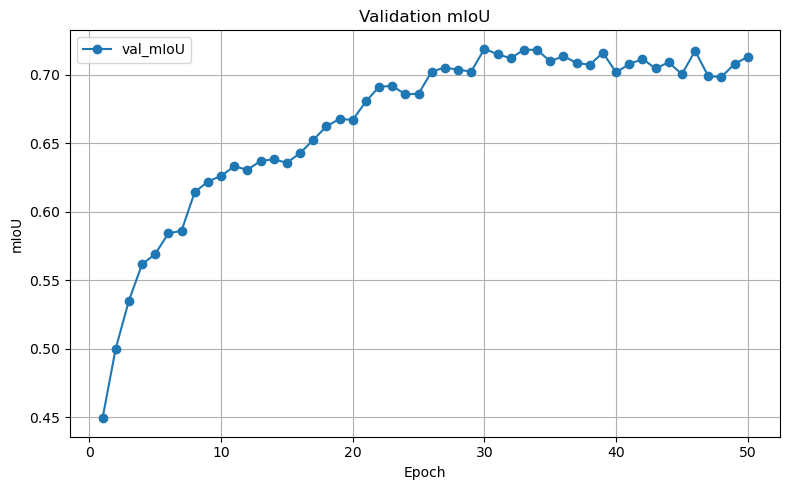

In [29]:
plt.figure(figsize=(8,5))
plt.plot(kitti_history["epoch"], kitti_history["val_miou"], marker="o", label="val_mIoU")
plt.xlabel("Epoch")
plt.ylabel("mIoU")
plt.title("Validation mIoU")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

1.8 Inference with the Best kitti_model

In [22]:
import os
TEST_IMG_DIR = r"D:\Semantic Visual Odometry and 3D Scene Reconstruction\KITTI\semantics\testing\image_2"

In [ ]:
from matplotlib.colors import ListedColormap

CLASS_COLORS = np.array([
    [199, 21, 133],  # 0 road
    [255, 69, 0],  # 1 sidewalk
    [ 139, 69, 19],  # 2 building
    [107,142, 35],  # 3 vegetation
    [ 70,130,180],  # 4 sky
    [  0,  0,142],  # 5 vehicle
    [220, 20, 60],  # 6 person
    [153,153,153],  # 7 pole
    [250,170, 30],  # 8 traffic sign/light
    [152,251,152],  # 9 terrain
], dtype=np.uint8)

CLASS_COLORS_NORM = CLASS_COLORS / 255.0 
SEMANTIC_CMAP = ListedColormap(CLASS_COLORS_NORM)

In [92]:
def show_inference_samples(
    model,
    img_dir,
    num_samples=5,
    image_size=(256, 832),
    device="cuda"
):
    model.eval()

    names = sorted([n for n in os.listdir(img_dir) if n.endswith(".png")])
    samples = random.sample(names, min(num_samples, len(names)))

    for name in samples:
        img_pil = Image.open(os.path.join(img_dir, name)).convert("RGB")

        img_resized = TF.resize(
            img_pil, image_size, interpolation=InterpolationMode.BILINEAR
        )
        x = TF.to_tensor(img_resized)
        x = TF.normalize(
            x,
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225],
        )
        x = x.unsqueeze(0).to(device)

        with torch.no_grad():
            logits = model(x)["out"]
            pred = logits.argmax(1)[0].cpu().numpy().astype(np.uint8)

        rgb_vis = np.array(img_resized)

        uniq = np.unique(pred)
        class_names = [TRAIN_ID_TO_NAME[c] for c in uniq if c in TRAIN_ID_TO_NAME]

        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(rgb_vis)
        plt.title("RGB")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(pred, cmap=SEMANTIC_CMAP, vmin=0, vmax=NUM_CLASSES - 1)
        plt.title(f"Semantic prediction\n({', '.join(class_names)})")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(rgb_vis)
        plt.imshow(pred, cmap=SEMANTIC_CMAP, vmin=0, vmax=NUM_CLASSES - 1, alpha=0.5)
        plt.title("Overlay")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

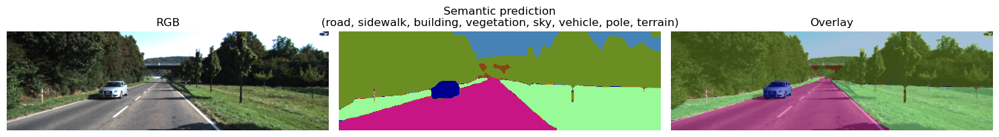

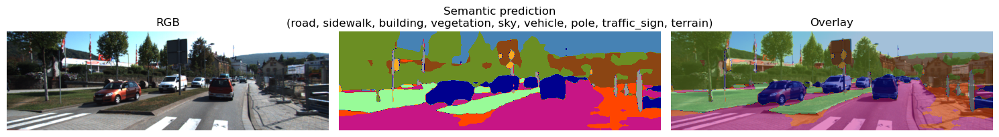

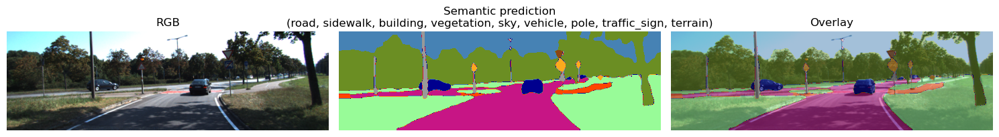

In [95]:
show_inference_samples(kitti_model, TEST_IMG_DIR, num_samples=3)

II. BDD_10_K

2.1 Data Loading

In [73]:
ROOT = Path(r"D:\Semantic Visual Odometry and 3D Scene Reconstruction\BDD_10K")

IMG_DIR = ROOT / "images" / "train"
GT_DIR  = ROOT / "semantic" / "labels" / "train"

In [74]:
print("RGB examples:")
for p in list(IMG_DIR.iterdir())[:5]:
    print(p.name)

print("\nGT examples:")
for p in list(GT_DIR.iterdir())[:5]:
    print(p.name)

RGB examples:
0004a4c0-d4dff0ad.jpg
00054602-3bf57337.jpg
00067cfb-e535423e.jpg
00091078-59817bb0.jpg
0010bf16-a457685b.jpg

GT examples:
0004a4c0-d4dff0ad_train_id.png
00054602-3bf57337_train_id.png
00067cfb-e535423e_train_id.png
00091078-59817bb0_train_id.png
0010bf16-a457685b_train_id.png


In [ ]:
assert IMG_DIR.exists(), f"Missing directory images/train: {IMG_DIR}"
assert GT_DIR.exists(),  f"Missing directory semantic/labels/train: {GT_DIR}"

NUM_SAMPLES = 2
random.seed(0)

pairs = []
for img_path in IMG_DIR.glob("*.jpg"):
    gt_path = GT_DIR / f"{img_path.stem}_train_id.png"
    if gt_path.exists():
        pairs.append((img_path, gt_path))

samples = random.sample(pairs, min(NUM_SAMPLES, len(pairs)))

In [76]:
unique_vals = set()
for _, gt_path in random.sample(pairs, 20):
    m = np.array(Image.open(gt_path))
    unique_vals.update(np.unique(m).tolist())

print("Unique values in BDD masks:", sorted(unique_vals))

Unique values in BDD masks: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 17, 18, 255]


In [77]:
BDD_TO_TRAIN_10 = {
    0: 0,   # road
    1: 1,   # sidewalk
    2: 2,   # building
    8: 3,   # vegetation
    10: 4,  # sky

    13: 5,  # car
    14: 5,  # truck
    15: 5,  # bus
    16: 5,  # train 
    17: 5,  # motorcycle 
    18: 5,  # bicycle 

    11: 6,  # person
    12: 6,  # rider

    5: 7,   # pole
    6: 8,   # traffic light-traffic_sign
    7: 8,   # traffic sign

    9: 9,   # terrain
}

In [78]:
rows = []

for img_path in sorted(IMG_DIR.glob("*.jpg")):  
    mask_path = GT_DIR / f"{img_path.stem}_train_id.png"
    if mask_path.exists():
        rows.append({
            "rgb_path": str(img_path),
            "mask_path": str(mask_path)
        })

bdd_train_df = pd.DataFrame(rows)

In [79]:
IMG_DIR_VAL = ROOT / "images" / "val"
GT_DIR_VAL  = ROOT / "semantic" / "labels" / "val"

assert IMG_DIR_VAL.exists(), f"Нет папки RGB val: {IMG_DIR_VAL}"
assert GT_DIR_VAL.exists(),  f"Нет папки semantic GT val: {GT_DIR_VAL}"

rows = []

for img_path in sorted(IMG_DIR_VAL.glob("*.jpg")):
    mask_path = GT_DIR_VAL / f"{img_path.stem}_train_id.png"
    if mask_path.exists():
        rows.append({
            "rgb_path": str(img_path),
            "mask_path": str(mask_path)
        })

bdd_val_df = pd.DataFrame(rows)

In [80]:
from sklearn.model_selection import train_test_split

bdd_train_df2, bdd_test_df = train_test_split(
    bdd_train_df,
    test_size=1500,
    random_state=42,
    shuffle=True
)

bdd_train_df2 = bdd_train_df2.reset_index(drop=True)
bdd_test_df   = bdd_test_df.reset_index(drop=True)

print("Train:", len(bdd_train_df2))
print("Val  :", len(bdd_val_df))      
print("Test :", len(bdd_test_df))   

Train: 5500
Val  : 1000
Test : 1500


2.2 Remapping Functions

C:\Users\egork\AppData\Local\Temp\ipykernel_20412\698199089.py:16: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  mask_vis[mask_vis == IGNORE] = -1


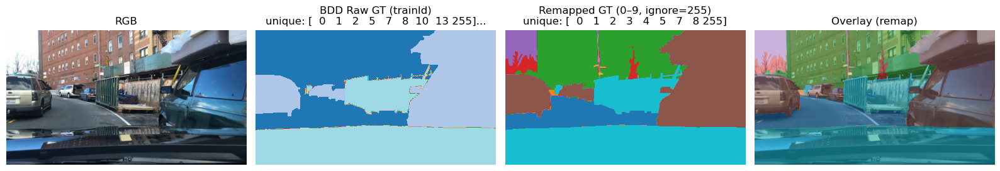

In [81]:
def remap_mask(mask_raw_np, mapping, ignore_index=255):
    out = np.full(mask_raw_np.shape, ignore_index, dtype=np.uint8)
    for src, dst in mapping.items():
        out[mask_raw_np == src] = dst
    return out

def show_bdd_remap_sample(df, mapping, seed=0):
    row = df.sample(1, random_state=seed).iloc[0]

    img = np.array(Image.open(row["rgb_path"]).convert("RGB"))
    mask_raw = np.array(Image.open(row["mask_path"]).convert("L"))  

    mask_remap = remap_mask(mask_raw, mapping, ignore_index=IGNORE)

    mask_vis = mask_remap.copy()
    mask_vis[mask_vis == IGNORE] = -1

    plt.figure(figsize=(16, 4))

    plt.subplot(1, 4, 1)
    plt.imshow(img)
    plt.title("RGB")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.imshow(mask_raw, cmap="tab20")
    plt.title(f"BDD Raw GT (trainId)\nunique: {np.unique(mask_raw)[:15]}...")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.imshow(mask_vis, cmap="tab10", vmin=0, vmax=NUM_CLASSES-1)
    plt.title(f"Remapped GT (0–9, ignore=255)\nunique: {np.unique(mask_remap)}")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.imshow(img)
    plt.imshow(mask_vis, cmap="tab10", vmin=0, vmax=NUM_CLASSES-1, alpha=0.5)
    plt.title("Overlay (remap)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

show_bdd_remap_sample(bdd_train_df2, BDD_TO_TRAIN_10, seed=6)

2.3 Individual Class Visualization (Validation)

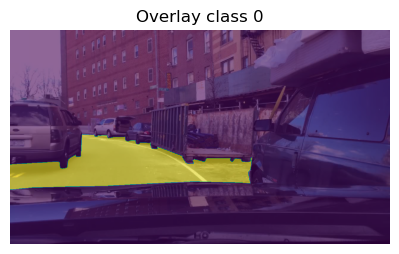

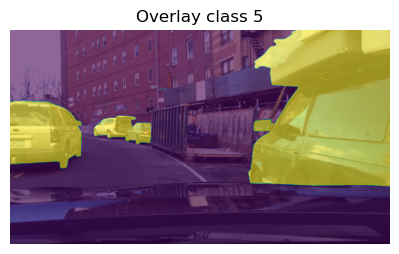

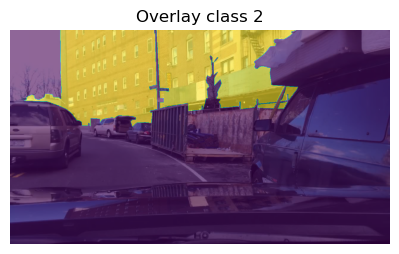

In [82]:
def show_overlay_class(df, mapping, train_class_id=5, seed=1):
    row = df.sample(1, random_state=seed).iloc[0]
    img = np.array(Image.open(row["rgb_path"]).convert("RGB"))
    mask_raw = np.array(Image.open(row["mask_path"]).convert("L"))
    mask = remap_mask(mask_raw, mapping, ignore_index=IGNORE)

    binary = (mask == train_class_id)

    plt.figure(figsize=(12,4))
    plt.subplot(1,3,3); plt.imshow(img); plt.imshow(binary, alpha=0.6); plt.title(f"Overlay class {train_class_id}"); plt.axis("off")
    plt.tight_layout()
    plt.show()

show_overlay_class(bdd_train_df2, BDD_TO_TRAIN_10, train_class_id=0, seed=6)  
show_overlay_class(bdd_train_df2, BDD_TO_TRAIN_10, train_class_id=5, seed=6) 
show_overlay_class(bdd_train_df2, BDD_TO_TRAIN_10, train_class_id=2, seed=6) 

2.4 DataLoader Creation

In [272]:
bdd_train_ds = SegDataset(bdd_train_df2, train=True, id_map=BDD_TO_TRAIN_10, ignore_index=255)
bdd_val_ds = SegDataset(bdd_val_df, train=False, id_map=BDD_TO_TRAIN_10, ignore_index=255)
bdd_test_ds = SegDataset(bdd_test_df, train=False, id_map=BDD_TO_TRAIN_10, ignore_index=255)

In [ ]:
bdd_train_loader = DataLoader(bdd_train_ds, batch_size=8, shuffle=True, num_workers=2, pin_memory=True, drop_last=True)
bdd_val_loader = DataLoader(bdd_val_ds, batch_size=8, shuffle=False, num_workers=2, pin_memory=True, drop_last=False)
bdd_test_loader = DataLoader(bdd_test_ds, batch_size=8, shuffle=False, num_workers=2, pin_memory=True, drop_last=False)

2.5 Model Initialization

In [79]:
from torchvision.models.segmentation import deeplabv3_resnet50

bdd_model = deeplabv3_resnet50(weights="DEFAULT")

bdd_model.classifier[-1] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)

if bdd_model.aux_classifier is not None:
    bdd_model.aux_classifier[-1] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)

bdd_model = bdd_model.to(DEVICE)

In [80]:
criterion = nn.CrossEntropyLoss(ignore_index=255)
bdd_optimizer = optim.AdamW(bdd_model.parameters(), lr=1e-4, weight_decay=1e-4)

scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE == "cuda"))

C:\Users\egork\AppData\Local\Temp\ipykernel_11836\3639820919.py:4: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE == "cuda"))


2.6 Training Loop

In [ ]:
EPOCHS = 50
best_miou = -1.0
best_epoch = -1

bdd_history = {"epoch": [], "train_loss": [], "val_loss": [], "val_miou": []}

for epoch in range(1, EPOCHS + 1):
    bdd_train_loss = train_one_epoch(bdd_model, bdd_train_loader, bdd_optimizer, scaler, criterion)
    bdd_val_loss, bdd_miou, per_class_iou = evaluate(bdd_model, bdd_val_loader, criterion, num_classes=NUM_CLASSES, ignore_index=IGNORE)

    bdd_history["epoch"].append(epoch)
    bdd_history["train_loss"].append(bdd_train_loss)
    bdd_history["val_loss"].append(bdd_val_loss)
    bdd_history["val_miou"].append(bdd_miou)

    print(f"[Epoch {epoch:02d}] train_loss={bdd_train_loss:.4f} | val_loss={bdd_val_loss:.4f} | mIoU={bdd_miou:.4f}")

    if bdd_miou > best_miou:
        best_miou = bdd_miou
        best_epoch = epoch
        torch.save(bdd_model.state_dict(), "bdd_deeplabv3_best.pth")
        print(f"saved best checkpoint: mIoU={best_miou:.4f} (epoch {best_epoch})")

print("Best mIoU:", best_miou, "at epoch", best_epoch)

2.7 Training History Visualization

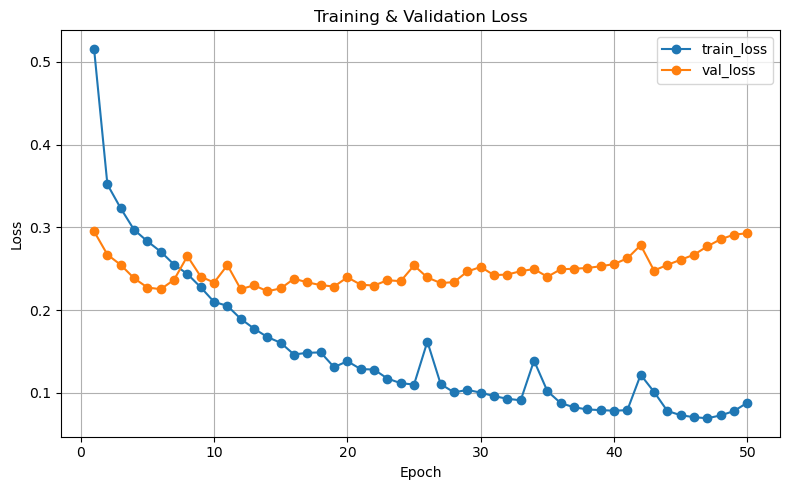

In [83]:
plt.figure(figsize=(8,5))
plt.plot(bdd_history["epoch"], bdd_history["train_loss"], marker="o", label="train_loss")
plt.plot(bdd_history["epoch"], bdd_history["val_loss"], marker="o", label="val_loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

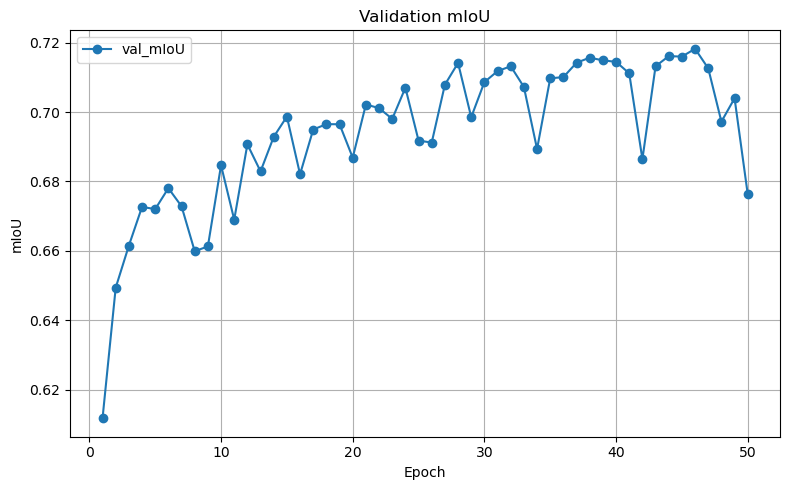

In [85]:
plt.figure(figsize=(8,5))
plt.plot(bdd_history["epoch"], bdd_history["val_miou"], marker="o", label="val_mIoU")
plt.xlabel("Epoch")
plt.ylabel("mIoU")
plt.title("Validation mIoU")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

2.8 Evaluation of kitti_model and bdd_model on the BDD_10K Dataset

bdd_model

In [86]:
test_loss, test_miou, test_per_class_iou = evaluate(
    bdd_model, bdd_test_loader, criterion,
    num_classes=NUM_CLASSES, ignore_index=IGNORE
)
print(f"FINAL TEST (held-out): loss={test_loss:.4f} | mIoU={test_miou:.4f}")

Val:   0%|                                                                                     | 0/188 [00:00<?, ?it/s]C:\Users\egork\AppData\Local\Temp\ipykernel_11836\2025061997.py:55: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE == "cuda")):
                                                                                                                       

FINAL TEST (held-out): loss=0.4565 | mIoU=0.6347


kitti_model

In [87]:
test_loss, test_miou, test_per_class_iou = evaluate(
    kitti_model, bdd_test_loader, criterion,
    num_classes=NUM_CLASSES, ignore_index=IGNORE
)
print(f"FINAL TEST (held-out): loss={test_loss:.4f} | mIoU={test_miou:.4f}")

Val:   0%|                                                                                     | 0/188 [00:00<?, ?it/s]C:\Users\egork\AppData\Local\Temp\ipykernel_11836\2025061997.py:55: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE == "cuda")):
                                                                                                                       

FINAL TEST (held-out): loss=0.7207 | mIoU=0.4533


III. Combined Dataset (KITTI + BDD_10K)

3.1 Dataset Concatenation

In [133]:
from torch.utils.data import ConcatDataset, DataLoader

In [134]:
kitti_all = kitti_df.copy()
kitti_all["source"] = "kitti"

In [135]:
bdd_all_train = bdd_train_df.copy()
bdd_all_train["source"] = "bdd"

In [136]:
bdd_all_val = bdd_val_df.copy()
bdd_all_val["source"] = "bdd"

In [137]:
all_df = pd.concat([kitti_all, bdd_all_train, bdd_all_val], ignore_index=True)
len(all_df)

8200

In [115]:
train_df, temp_df = train_test_split(
    all_df,
    test_size=0.2,
    random_state=42,
    shuffle=True,
    stratify=all_df["source"]
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.5,
    random_state=42,
    shuffle=True,
    stratify=temp_df["source"]
)

train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

In [118]:
print(len(train_df))
print(len(val_df))
print(len(test_df))

6560
820
820


3.2 Custom Dataset with Separate KITTI and BDD_10K Subsets

In [280]:
class MixedSegDataset(Dataset):
    def __init__(self, df, train=True, image_size=(256, 832),
                 maps=None, ignore_index=255):
        self.df = df.reset_index(drop=True)
        self.train = train
        self.image_size = image_size
        self.maps = maps or {}
        self.ignore_index = ignore_index

    def __len__(self):
        return len(self.df)

    def _augment(self, img, mask):
        if random.random() < 0.5:
            img = TF.hflip(img)
            mask = TF.hflip(mask)
        if random.random() < 0.3:
            img = TF.adjust_brightness(img, 0.9 + 0.2 * random.random())
        if random.random() < 0.3:
            img = TF.adjust_contrast(img, 0.9 + 0.2 * random.random())
        return img, mask

    def _remap(self, mask_raw_np, src):
        id_map = self.maps[src]
        out = np.full(mask_raw_np.shape, self.ignore_index, dtype=np.uint8)
        for src_id, train_id in id_map.items():
            out[mask_raw_np == src_id] = train_id
        return out

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        src = row["source"]

        img = Image.open(row["rgb_path"]).convert("RGB")
        mask_raw = Image.open(row["mask_path"]).convert("L")

        H, W = self.image_size
        img = TF.resize(img, (H, W), interpolation=InterpolationMode.BILINEAR)
        mask_raw = TF.resize(mask_raw, (H, W), interpolation=InterpolationMode.NEAREST)

        if self.train:
            img, mask_raw = self._augment(img, mask_raw)

        img = TF.to_tensor(img)
        img = TF.normalize(img, mean=[0.485, 0.456, 0.406],
                                std=[0.229, 0.224, 0.225])

        mask_np = np.array(mask_raw, dtype=np.uint8)
        mask_np = self._remap(mask_np, src)
        mask = torch.from_numpy(mask_np.astype(np.int64))
        return img, mask

In [281]:
maps = {
    "kitti": RAW_TO_TRAIN_10,
    "bdd":   BDD_TO_TRAIN_10,
}

3.3 DataLoader Creation

In [305]:
train_ds = MixedSegDataset(train_df, train=True, image_size=IMAGE_SIZE, maps=maps, ignore_index=255)
val_ds = MixedSegDataset(val_df, train=False, image_size=IMAGE_SIZE, maps=maps, ignore_index=255)
test_ds = MixedSegDataset(test_df, train=False, image_size=IMAGE_SIZE, maps=maps, ignore_index=255)

In [ ]:
general_train_loader = DataLoader(train_ds, batch_size=8, shuffle=True, num_workers=2, pin_memory=True, drop_last=True)
general_val_loader = DataLoader(val_ds, batch_size=8, shuffle=False, num_workers=2, pin_memory=True, drop_last=False)
general_test_loader = DataLoader(test_ds, batch_size=8, shuffle=False, num_workers=2, pin_memory=True, drop_last=False)

3.4 Model Initialization

In [154]:
general_model = deeplabv3_resnet50(weights="DEFAULT")

general_model.classifier[-1] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)

if general_model.aux_classifier is not None:
    general_model.aux_classifier[-1] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)

general_model = general_model.to(DEVICE)

In [155]:
criterion = nn.CrossEntropyLoss(ignore_index=255)
general_optimizer = optim.AdamW(general_model.parameters(), lr=1e-4, weight_decay=1e-4)

scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE == "cuda"))

C:\Users\egork\AppData\Local\Temp\ipykernel_11836\468257778.py:4: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE == "cuda"))


3.5 Training Loop

In [ ]:
EPOCHS = 50
best_miou = -1.0
best_epoch = -1

general_history = {"epoch": [], "train_loss": [], "val_loss": [], "val_miou": []}

for epoch in range(1, EPOCHS + 1):
    general_train_loss = train_one_epoch(general_model, general_train_loader, general_optimizer, scaler, criterion)
    general_val_loss, general_miou, per_class_iou = evaluate(general_model, general_val_loader, criterion, num_classes=NUM_CLASSES, ignore_index=IGNORE)

    general_history["epoch"].append(epoch)
    general_history["train_loss"].append(general_train_loss)
    general_history["val_loss"].append(general_val_loss)
    general_history["val_miou"].append(general_miou)

    print(f"[Epoch {epoch:02d}] train_loss={general_train_loss:.4f} | val_loss={general_val_loss:.4f} | mIoU={general_miou:.4f}")

    if general_miou > best_miou:
        best_miou = general_miou
        best_epoch = epoch
        torch.save(general_model.state_dict(), "general_deeplabv3_best.pth")
        print(f"saved best checkpoint: mIoU={best_miou:.4f} (epoch {best_epoch})")

print("Best mIoU:", best_miou, "at epoch", best_epoch)

3.6 Training History Visualization

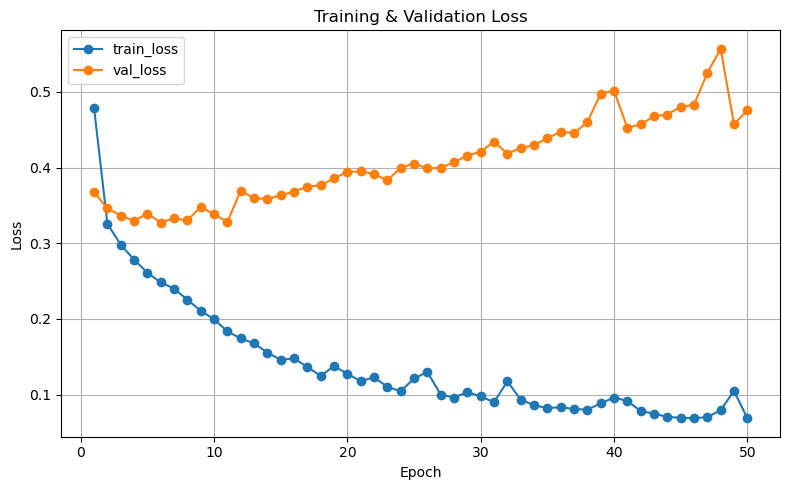

In [157]:
plt.figure(figsize=(8,5))
plt.plot(general_history["epoch"], general_history["train_loss"], marker="o", label="train_loss")
plt.plot(general_history["epoch"], general_history["val_loss"], marker="o", label="val_loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

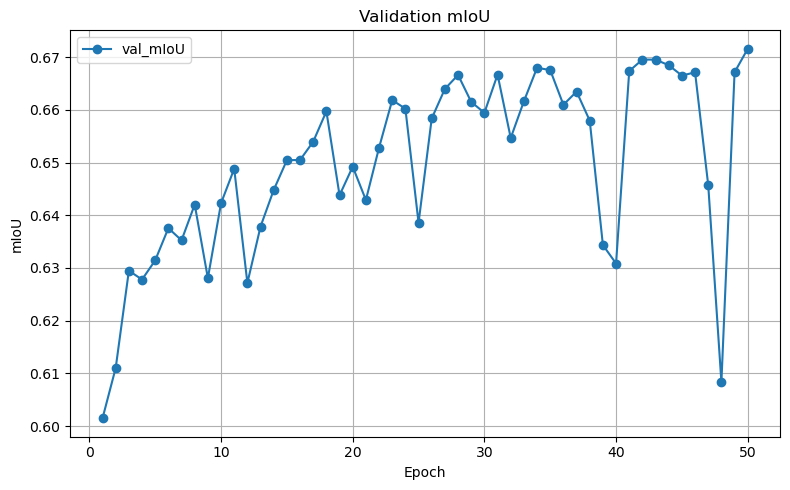

In [158]:
plt.figure(figsize=(8,5))
plt.plot(general_history["epoch"], general_history["val_miou"], marker="o", label="val_mIoU")
plt.xlabel("Epoch")
plt.ylabel("mIoU")
plt.title("Validation mIoU")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

IV. Final Evaluation of All Models on the Unified Dataset

4.1 kitti_model test

In [286]:
test_loss, test_miou, test_per_class_iou = evaluate(
    kitti_model, general_test_loader, criterion,
    num_classes=NUM_CLASSES, ignore_index=IGNORE
)
print(f"FINAL TEST (held-out): loss={test_loss:.4f} | mIoU={test_miou:.4f}")

Val:   0%|                                                                                     | 0/103 [00:00<?, ?it/s]C:\Users\egork\AppData\Local\Temp\ipykernel_11836\2025061997.py:55: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE == "cuda")):
                                                                                                                       

FINAL TEST (held-out): loss=0.7023 | mIoU=0.4686


4.2 bdd_model test

In [285]:
test_loss, test_miou, test_per_class_iou = evaluate(
    bdd_model, general_test_loader, criterion,
    num_classes=NUM_CLASSES, ignore_index=IGNORE
)
print(f"FINAL TEST (held-out): loss={test_loss:.4f} | mIoU={test_miou:.4f}")

Val:   0%|                                                                                     | 0/103 [00:00<?, ?it/s]C:\Users\egork\AppData\Local\Temp\ipykernel_11836\2025061997.py:55: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE == "cuda")):
                                                                                                                       

FINAL TEST (held-out): loss=0.1685 | mIoU=0.7761


4.3 general_model test

In [284]:
test_loss, test_miou, test_per_class_iou = evaluate(
    general_model, general_test_loader, criterion,
    num_classes=NUM_CLASSES, ignore_index=IGNORE
)
print(f"FINAL TEST (held-out): loss={test_loss:.4f} | mIoU={test_miou:.4f}")

Val:   0%|                                                                                     | 0/103 [00:00<?, ?it/s]C:\Users\egork\AppData\Local\Temp\ipykernel_11836\2025061997.py:55: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE == "cuda")):
                                                                                                                       

FINAL TEST (held-out): loss=0.4421 | mIoU=0.6731


V. Inference of the Best Models on RGB Images from the KITTI Visual Odometry Dataset

In [255]:
INF_DIR = Path(r"D:\Semantic Visual Odometry and 3D Scene Reconstruction\KITTI\odometry\sequences\00\image_2")

5.1 general_model Inference

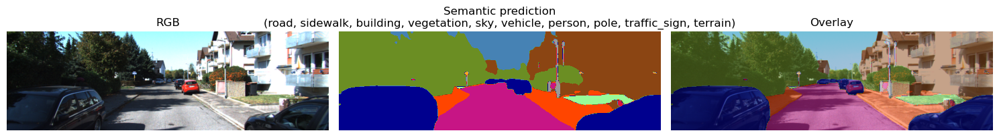

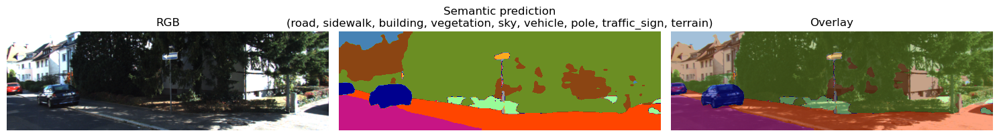

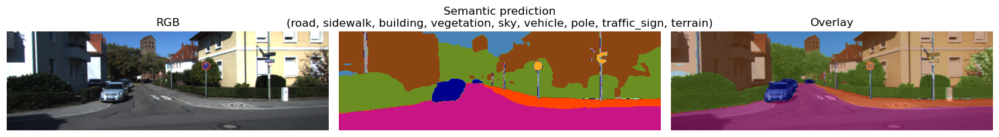

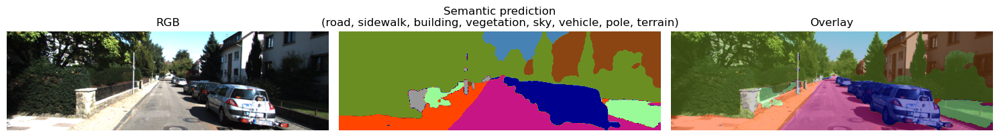

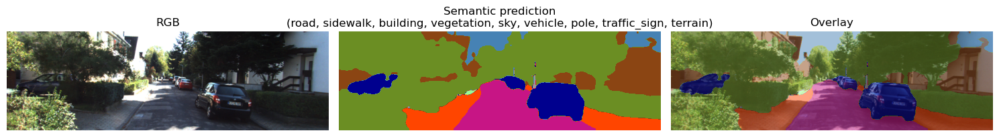

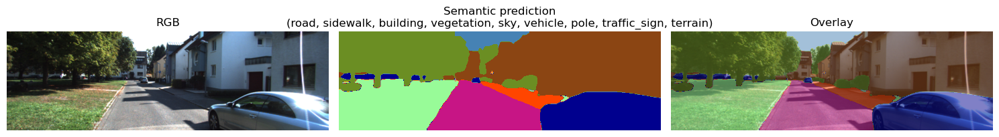

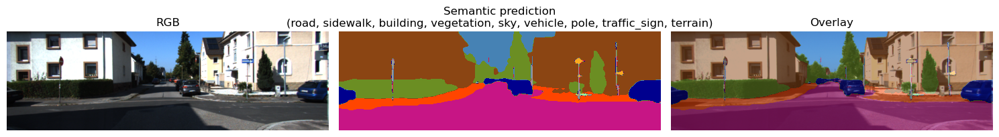

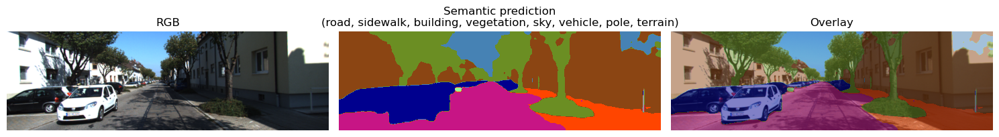

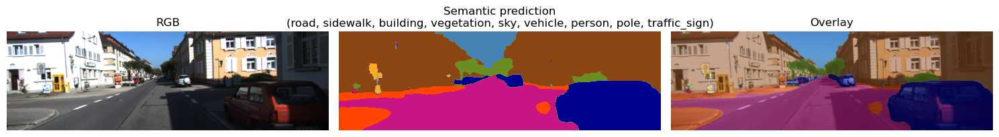

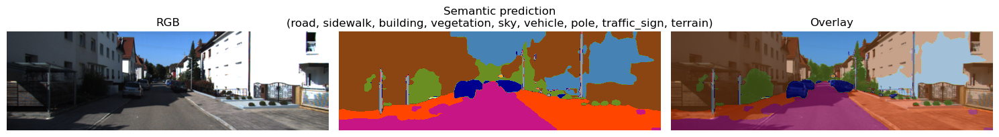

In [492]:
random.seed(42)
show_inference_samples(general_model, INF_DIR, num_samples=10)

5.2 bdd_model Inference

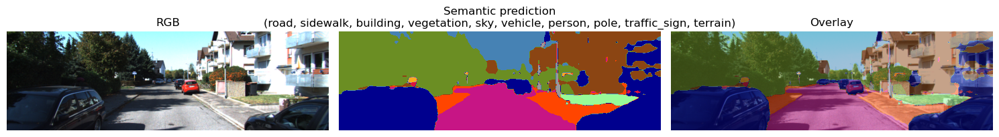

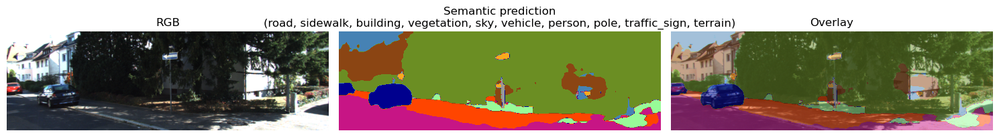

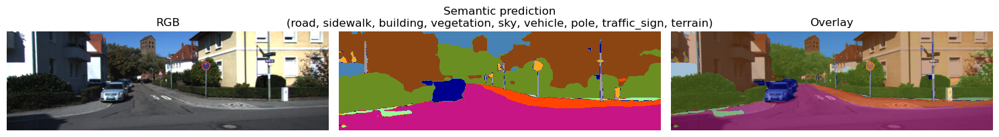

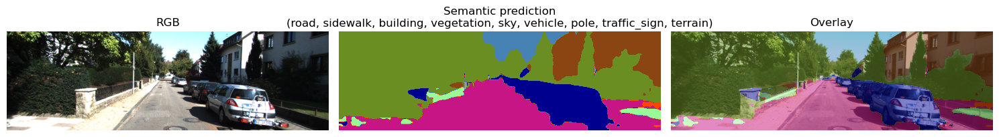

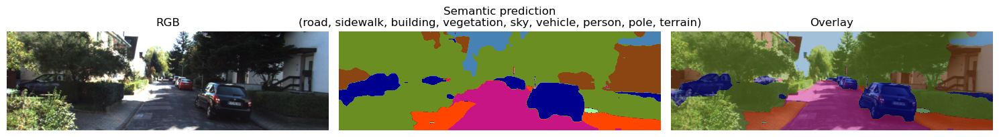

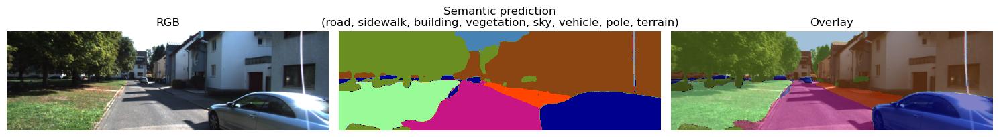

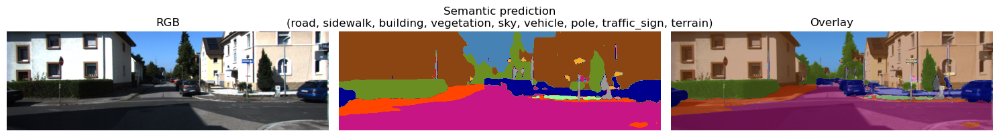

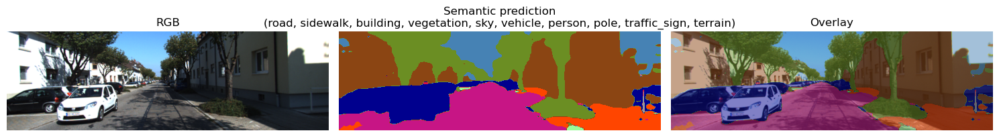

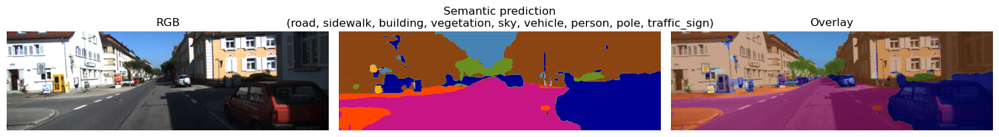

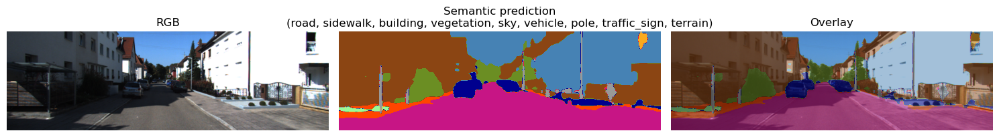

In [493]:
random.seed(42)
show_inference_samples(bdd_model, INF_DIR, num_samples=10)

In [318]:
final_model = general_model
torch.save(final_model.state_dict(), "final_model.pth")